In [2]:
from urllib.request import urlopen, Request
from bs4 import BeautifulSoup, Comment
from selenium.webdriver.common.keys import Keys
import pandas as pd
import numpy as np
from selenium import webdriver
import time
import requests
import random
import re

In [2]:
chrome_part = "C:/Program Files/Google/Chrome/Application/chromedriver"
driver = webdriver.Chrome(chrome_part)
driver.get("https://www.arabam.com/ikinci-el/otomobil?take=50")
header = {"User-Agent" : "Mozilla/5.0 (Windows NT 10.0; WOW64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/91.0.4472.114 Safari/537.36"}

In [41]:
chrome_part = "C:/Program Files/Google/Chrome/Application/chromedriver"
driver = webdriver.Chrome(chrome_part)
driver.get("https://www.arabam.com/ikinci-el/otomobil?take=50")
header = {"User-Agent" : "Mozilla/5.0 (Windows NT 10.0; WOW64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/91.0.4472.114 Safari/537.36"}
liste = []
a = 1
while a <=50:
    sayfamiz = driver.page_source
    soup = BeautifulSoup(sayfamiz, "lxml") # sayfayı beautifulsoup ile parçaladık
    s1 = soup.find("table", attrs = {"class":"table listing-table w100 border-grey2"})
    s2 = s1.find_all("tr", attrs = {"class":"listing-list-item pr should-hover bg-white"})
    for i in s2:
        link_sonu = i.a.get('href')
        link_basi = "https://www.arabam.com/"
        link = link_basi+link_sonu
        r1 = requests.get(link, headers = header)
        soup1 = BeautifulSoup(r1.content, "lxml")
        fiyat = soup1.find("span", {"class" : "color-red4 font-semi-big bold fl"})
        if fiyat == None:
            fiyat = soup1.find("span", {"class" : "color-red4 font-semi-big bold fl w66"})
            if fiyat == None:
                fiyat = "None"
        try:
            yer = soup1.find("p", attrs = {"class":"one-line-overflow font-default-minus pt4 color-black2018 bold"}).text
        except:
            yer = "None"
        try:
            ilan_no = soup1.find(text=re.compile("İlan No:"))
            ilan_no = ilan_no.findNext().text
        except:
            ilan_no = "None"
        try:
            ilan_tarihi = soup1.find(text=re.compile("İlan Tarihi:"))
            ilan_tarihi = ilan_tarihi.findNext().text
        except:
            ilan_tarihi = "None"
        try:
            marka = soup1.find(text=re.compile("Marka:"))
            marka = marka.findNext().text
        except:
            marka = "None"
        try:
            seri = soup1.find(text=re.compile("Seri:"))
            seri = seri.findNext().text
        except:
            seri = "None"
        try:
            model = soup1.find(text=re.compile("Model:"))
            model = model.findNext().text
        except:
            model = "None"
        try:
            yıl = soup1.find(text=re.compile("Yıl:"))
            yıl = yıl.findNext().text
        except:
            yıl = "None"
        try:
            yakıt = soup1.find(text=re.compile("Yakıt Tipi:"))
            yakıt = yakıt.findNext().text
        except:
            yakıt = "None"
        try:
            vites = soup1.find(text=re.compile("Vites Tipi:"))
            vites = vites.findNext().text
        except:
            vites = "None"
        try:
            km = soup1.find(text=re.compile("Kilometre:"))
            km = km.findNext().text
        except:
            km = "None"
        try:
            hacim = soup1.find(text=re.compile("Motor Hacmi:"))
            hacim = hacim.findNext().text
        except:
            hacim = "None"
        try:
            guc = soup1.find(text=re.compile("Motor Gücü:"))
            guc = guc.findNext().text
        except:
            guc = "None"
        try:
            kimden = soup1.find(text=re.compile("Kimden:"))
            kimden = kimden.findNext().text
        except:
            kimden = "None"
        try:
            takas = soup1.find(text=re.compile("Takasa Uygun:"))
            takas = takas.findNext().text
        except:
            takas = "None"
        try:
            boya_degisen = soup1.find(text=re.compile("Boya-değişen:"))
            boya_degisen = boya_degisen.findNext().text
        except:
            boya_degisen = "None"
        liste.append([fiyat.text,yer,ilan_no,ilan_tarihi, marka, seri, model, yıl, yakıt, vites, km, hacim, guc, kimden, takas, boya_degisen])
    a = a+ 1
    time.sleep(.5+2*random.random())

In [42]:
df = pd.DataFrame(liste)
df.columns = ["price","city", "announcement_no", "announcement_date", "make", "seri", "model", "year", "fuel", "gear_type", "km", "engine_size","horse_power","from_who","exchange","dye_parts replaced"]

In [47]:
df = pd.read_csv("cars.csv")

In [48]:
df.drop('Unnamed: 0', axis = 1, inplace = True)
df.drop('Unnamed: 0.1', axis = 1, inplace = True)

In [49]:
df.head(10)

,price,city,announcement_no,announcement_date,make,seri,model,year,fuel,gear_type,km,engine_size,horse_power,from_who,exchange,dye_parts replaced
0,138.000 TL,GAZİANTEP / ŞEHİTKAMİL / AYDINLAR MAHALLESİ,17090991,27 Temmuz 2021,Alfa Romeo,Giulietta,1.6 JTD Distinctive,2015,Dizel,Düz,145.000 km,1598 cc,105 hp,Galeriden,Takasa Uygun Değil,"2 değişen, 3 boyalı"
1,124.750 TL,İSTANBUL / KARTAL / ORTA MAHALLESİ,17951574,27 Temmuz 2021,Alfa Romeo,MiTo,1.3 JTD City,2013,Dizel,Düz,150.000 km,1248 cc,95 hp,Galeriden,Takasa Uygun,7 boyalı
2,83.500 TL,İSTANBUL / KARTAL / ORTA MAHALLESİ,17951572,27 Temmuz 2021,Alfa Romeo,156,2.0 JTS Distinctive,2003,Benzin,Otomatik,238.600 km,1801 - 2000 cm3,151 - 175 HP,Galeriden,Takasa Uygun Değil,"1 değişen, 11 boyalı"
3,79.999 TL,MANİSA / YUNUSEMRE / KEÇİLİKÖY OSB,17949191,27 Temmuz 2021,Alfa Romeo,147,1.6 TS Progression,2006,LPG & Benzin,Düz,192.500 km,1598 cc,120 hp,Sahibinden,Takasa Uygun Değil,3 boyalı
4,113.000 TL,MERSİN / MEZİTLİ / AKDENİZ MAHALLESİ,16366773,27 Temmuz 2021,Alfa Romeo,Giulietta,1.6 JTD Distinctive,2011,Dizel,Düz,208.000 km,1598 cc,105 hp,Sahibinden,Takasa Uygun Değil,1 değişen
5,152.500 TL,İSTANBUL / ESENYURT / ÖRNEK MAHALLESİ,17946990,26 Temmuz 2021,Alfa Romeo,159,1.9 JTD Distinctive Plus,2009,Dizel,Yarı Otomatik,120.000 km,1910 cc,150 hp,Sahibinden,Takasa Uygun,10 boyalı
6,72.500 TL,GİRESUN / MERKEZ / HACI HÜSEYİN MAHALLESİ,17946828,26 Temmuz 2021,Alfa Romeo,156,1.6 TS Distinctive,2005,LPG & Benzin,Düz,290.000 km,1598 cc,120 hp,Galeriden,Takasa Uygun,Belirtilmemiş
7,128.000 TL,KAHRAMANMARAŞ / ONİKİŞUBAT / TEKEREK MAHALLESİ,17945616,26 Temmuz 2021,Alfa Romeo,159,1.9 JTD Distinctive,2008,Dizel,Otomatik,259.000 km,1801 - 2000 cm3,126 - 150 HP,Galeriden,Takasa Uygun,Belirtilmemiş
8,119.750 TL,ANTALYA / ALANYA / HACET MAHALLESİ,17736088,26 Temmuz 2021,Alfa Romeo,159,1.9 JTS Distinctive,2009,Benzin,Düz,140.000 km,1859 cc,160 hp,Galeriden,Takasa Uygun,Belirtilmemiş
9,53.000 TL,ANTALYA / DÖŞEMEALTI / BAHÇEYAKA MAHALLESİ,17521362,26 Temmuz 2021,Alfa Romeo,156,2.0 TS Executive,2001,LPG & Benzin,Düz,200.000 km,1970 cc,155 hp,Sahibinden,Takasa Uygun Değil,Belirtilmemiş


In [50]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45625 entries, 0 to 45624
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   price               45625 non-null  object
 1   city                45625 non-null  object
 2   announcement_no     45625 non-null  int64 
 3   announcement_date   45625 non-null  object
 4   make                45625 non-null  object
 5   seri                45625 non-null  object
 6   model               45625 non-null  object
 7   year                45625 non-null  int64 
 8   fuel                45625 non-null  object
 9   gear_type           45625 non-null  object
 10  km                  45625 non-null  object
 11  engine_size         45625 non-null  object
 12  horse_power         45625 non-null  object
 13  from_who            45625 non-null  object
 14  exchange            45625 non-null  object
 15  dye_parts replaced  45625 non-null  object
dtypes: int64(2), object(14

# Data Preprocessing

In [51]:
df["city"]=df["city"].str.split("/", n=1, expand=True )
df["engine_size"]=df["engine_size"].str.split("-", n=1, expand=True)
df["horse_power"]=df["horse_power"].str.split("-", n=1, expand=True)
df["fuel"]=df["fuel"].str.split("&", n=1, expand=True)

In [52]:
df['price']=df.price.str.strip()
df['city']=df.city.str.strip()
df['announcement_date']=df.announcement_date.str.strip()
df['make']=df.make.str.strip()
df['seri']=df.seri.str.strip()
df['model']=df.model.str.strip()
df['fuel']=df.fuel.str.strip()
df['gear_type']=df.gear_type.str.strip()
df['km']=df.km.str.strip()
df['engine_size']=df.engine_size.str.strip()
df['horse_power']=df.horse_power.str.strip()
df['from_who']=df.from_who.str.strip()
df['exchange']=df.exchange.str.strip()
df['dye_parts replaced']=df.exchange.str.strip()

In [53]:
df["price"]=df["price"].str.replace("TL","")
df["km"]=df["km"].str.replace("km","")
df["engine_size"]=df["engine_size"].str.replace("cc","")
df["horse_power"]=df["horse_power"].str.replace("hp","")
df["horse_power"]=df["horse_power"].str.replace("HP","")
df["horse_power"]=df["horse_power"].str.replace("50 HP'ye kadar","")
df["horse_power"]=df["horse_power"].str.replace("50 'ye kadar","")
df["price"]=df["price"].str.replace(".","")
df["km"]=df["km"].str.replace(".","")
df["engine_size"]=df["engine_size"].str.replace("cm3' e kadar","")
df["from_who"]=df["from_who"].str.replace("Yetkili Bayiden","authorized dealer")
df["from_who"]=df["from_who"].str.replace("Sahibinden","owner")
df["from_who"]=df["from_who"].str.replace("Galeriden","gallery")
df["gear_type"]=df["gear_type"].str.replace("Düz","manuel")
df["gear_type"]=df["gear_type"].str.replace("Otomatik","automatic")
df["fuel"]=df["fuel"].str.replace("Dizel","Diesel")
df["fuel"]=df["fuel"].str.replace("Benzin","Fuel")
df["fuel"]=df["fuel"].str.replace("LPG & Benzing","LPG")
df["gear_type"]=df["gear_type"].str.replace("Yarı automatic","semi-automatic")

<ipython-input-53-ef121c4e485e>:8: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will*not* be treated as literal strings when regex=True.
  df["price"]=df["price"].str.replace(".","")
<ipython-input-53-ef121c4e485e>:9: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will*not* be treated as literal strings when regex=True.
  df["km"]=df["km"].str.replace(".","")


In [54]:
# Dropping NaN
df = df.replace("None", np.NaN)
df = df.replace("-", np.NaN)
df = df.replace(" ", np.NaN)
df = df.replace("", np.NaN)
df = df.dropna(how = 'any')

In [55]:
# Dropping different type money
patternGBP = "GBP"

GBP = df['price'].str.contains(patternGBP)

df = df[~GBP]

In [56]:
# Converting Type
df['price']=df['price'].astype(int)
df['km']=df['km'].astype(int)
df['engine_size']=df['engine_size'].astype(int)
df['horse_power']=df['horse_power'].astype(int)

In [57]:
# Drop columns
df.drop(columns=["announcement_no"], inplace=True)
df.drop(columns=["announcement_date"], inplace=True)
df.drop(columns=["model"], inplace=True)
df.drop(columns=["seri"], inplace=True)
df.drop(columns=["dye_parts replaced"], inplace=True)

In [58]:
df.set_index('price')

,city,make,year,fuel,gear_type,km,engine_size,horse_power,from_who,exchange
price,,,,,,,,,,
138000,GAZİANTEP,Alfa Romeo,2015,Diesel,manuel,145000,1598,105,gallery,Takasa Uygun Değil
124750,İSTANBUL,Alfa Romeo,2013,Diesel,manuel,150000,1248,95,gallery,Takasa Uygun
83500,İSTANBUL,Alfa Romeo,2003,Fuel,automatic,238600,1801,151,gallery,Takasa Uygun Değil
79999,MANİSA,Alfa Romeo,2006,LPG,manuel,192500,1598,120,owner,Takasa Uygun Değil
113000,MERSİN,Alfa Romeo,2011,Diesel,manuel,208000,1598,105,owner,Takasa Uygun Değil
...,...,...,...,...,...,...,...,...,...,...
97500,İSTANBUL,Chrysler,1997,Fuel,automatic,70000,2497,163,owner,Takasa Uygun
205000,İSTANBUL,Chrysler,1996,LPG,automatic,128000,3518,215,gallery,Takasa Uygun Değil
185000,İSTANBUL,Chrysler,2007,Diesel,automatic,270000,2987,218,gallery,Takasa Uygun


In [59]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 44821 entries, 0 to 45624
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   price        44821 non-null  int32 
 1   city         44821 non-null  object
 2   make         44821 non-null  object
 3   year         44821 non-null  int64 
 4   fuel         44821 non-null  object
 5   gear_type    44821 non-null  object
 6   km           44821 non-null  int32 
 7   engine_size  44821 non-null  int32 
 8   horse_power  44821 non-null  int32 
 9   from_who     44821 non-null  object
 10  exchange     44821 non-null  object
dtypes: int32(4), int64(1), object(6)
memory usage: 3.4+ MB


In [60]:
df.to_pickle("last_cars")

In [3]:
df = pd.read_pickle("last_cars")

In [4]:
df1 = df.loc[df['price'] <= 500000,:]

# Exploratory Data Analysis

In [11]:
import pandas as pd
import numpy as np
import chart_studio.plotly as py
import cufflinks as cf
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import requests
import json

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
cf.go_offline()

In [6]:
price_make1 = df.groupby('make')[['make','price']].mean().sort_values(by='price',ascending=True).reset_index()
price_make2 = df1.groupby('make')[['make','price']].mean().sort_values(by='price',ascending=True).reset_index()

In [7]:
fig = px.sunburst(price_make1, path=['price', 'make'], values='price',
                  color='price',
                  color_continuous_scale='RdBu',)
fig.update_layout(title_text="Price and Make",title_x=0.5, font_size=15)
fig.show()

In [8]:
fig = px.sunburst(price_make2, path=['price', 'make'], values='price',
                  color='price',
                  color_continuous_scale='RdBu',)
fig.update_layout(title_text="Price and Make After Drop Price",title_x=0.5, font_size=15)
fig.show()

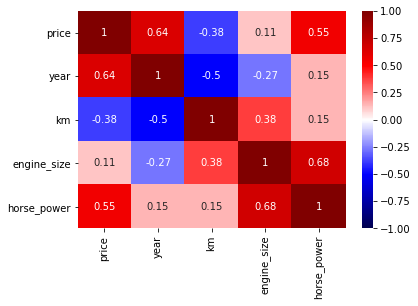

In [9]:
sns.heatmap(df1.corr(), cmap="seismic", annot=True, vmin=-1, vmax=1);

<Figure size 1296x504 with 0 Axes>

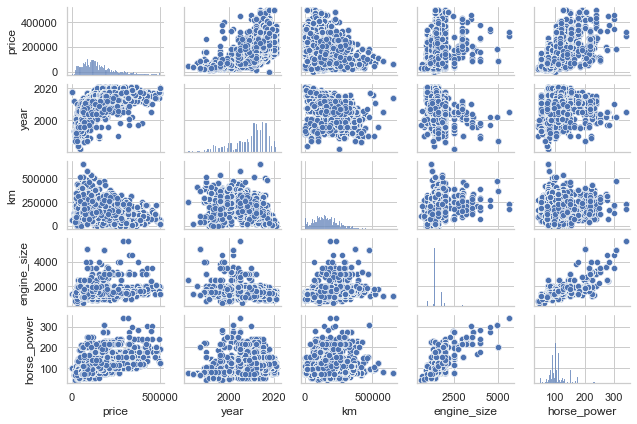

In [12]:
#Pairplot 
plt.figure(1, figsize=(18, 7))
sns.set(style="whitegrid")
g=sns.pairplot(df1, height=1.2, aspect=1.5)
plt.yticks(rotation=90); 
plt.show()

In [96]:
cities = df.groupby('city')[['city','price']].mean().sort_values(by='city',ascending=True).reset_index()
cities = pd.DataFrame(cities)
cities['city']=cities['city'].str.capitalize()
cities['city']=cities.city.str.strip()
cities

,city,price
0,Adana,168594.930292
1,Adiyaman,137096.114519
2,Afyonkarahi̇sar,98926.751592
3,Aksaray,43501.339286
4,Amasya,96250.000000
...,...,...
72,Çorum,107386.666667
73,İstanbul,196547.206259
74,İzmi̇r,158490.722372
75,Şanliurfa,126739.178082


In [107]:
cities.loc[cities['city'] == 'Adiyaman'] = cities.loc[cities['city']
                                                == 'Adiyaman'].replace('Adiyaman', 'Adıyaman')
cities.loc[cities['city'] == 'Afyonkarahi̇sar'] = cities.loc[cities['city']
                                                == 'Afyonkarahi̇sar'].replace('Afyonkarahi̇sar', 'Afyon')
cities.loc[cities['city'] == 'Artvi̇n'] = cities.loc[cities['city']
                                                == 'Artvi̇n'].replace('Artvi̇n', 'Artvin')
cities.loc[cities['city'] == 'Aydin'] = cities.loc[cities['city']
                                                == 'Aydin'].replace('Aydin', 'Aydın')
cities.loc[cities['city'] == 'Ağri'] = cities.loc[cities['city']
                                                == 'Ağri'].replace('Ağri', 'Ağrı')
cities.loc[cities['city'] == 'Balikesi̇r'] = cities.loc[cities['city']
                                                == 'Balikesi̇r'].replace('Balikesi̇r', 'Balıkesir')
cities.loc[cities['city'] == 'Bartin'] = cities.loc[cities['city']
                                                == 'Bartin'].replace('Bartin', 'Bartın')
cities.loc[cities['city'] == 'Bi̇leci̇k'] = cities.loc[cities['city']
                                                == 'Bi̇leci̇k'].replace('Bi̇leci̇k', 'Bilecik')
cities.loc[cities['city'] == 'Bi̇ngöl'] = cities.loc[cities['city']
                                                == 'Bi̇ngöl'].replace('Bi̇ngöl', 'Bingöl')
cities.loc[cities['city'] == 'Bi̇tli̇s'] = cities.loc[cities['city']
                                                == 'Bi̇tli̇s'].replace('Bi̇tli̇s', 'Bitlis')
cities.loc[cities['city'] == 'Deni̇zli̇'] = cities.loc[cities['city']
                                                == 'Deni̇zli̇'].replace('Deni̇zli̇', 'Denizli')
cities.loc[cities['city'] == 'Di̇yarbakir'] = cities.loc[cities['city']
                                                == 'Di̇yarbakir'].replace('Di̇yarbakir', 'Diyarbakır')
cities.loc[cities['city'] == 'Edi̇rne'] = cities.loc[cities['city']
                                                == 'Edi̇rne'].replace('Edi̇rne', 'Edirne')
cities.loc[cities['city'] == 'Elaziğ'] = cities.loc[cities['city']
                                                == 'Elaziğ'].replace('Elaziğ', 'Elazığ')
cities.loc[cities['city'] == 'Erzi̇ncan'] = cities.loc[cities['city']
                                                == 'Erzi̇ncan'].replace('Erzi̇ncan', 'Erzincan')
cities.loc[cities['city'] == 'Eski̇şehi̇r'] = cities.loc[cities['city']
                                                == 'Eski̇şehi̇r'].replace('Eski̇şehi̇r', 'Eskişehir')
cities.loc[cities['city'] == 'Gazi̇antep'] = cities.loc[cities['city']
                                                == 'Gazi̇antep'].replace('Gazi̇antep', 'Gaziantep')
cities.loc[cities['city'] == 'Gi̇resun'] = cities.loc[cities['city']
                                                == 'Gi̇resun'].replace('Gi̇resun', 'Giresun')
cities.loc[cities['city'] == 'Iğdir'] = cities.loc[cities['city']
                                                == 'Iğdir'].replace('Iğdir', 'Iğdır')
cities.loc[cities['city'] == 'Kayseri̇'] = cities.loc[cities['city']
                                                == 'Kayseri̇'].replace('Kayseri̇', 'Kayseri')
cities.loc[cities['city'] == 'Kirikkale'] = cities.loc[cities['city']
                                                == 'Kirikkale'].replace('Kirikkale', 'Kırıkkale')
cities.loc[cities['city'] == 'Kirklareli̇'] = cities.loc[cities['city']
                                                == 'Kirklareli̇'].replace('Kirklareli̇', 'Kırklareli')
cities.loc[cities['city'] == 'Kirşehi̇r'] = cities.loc[cities['city']
                                                == 'Kirşehi̇r'].replace('Kirşehi̇r', 'Kırşehir')
cities.loc[cities['city'] == 'Kocaeli̇'] = cities.loc[cities['city']
                                                == 'Kocaeli̇'].replace('Kocaeli̇', 'Kocaeli')
cities.loc[cities['city'] == 'Ki̇li̇s'] = cities.loc[cities['city']
                                                == 'Ki̇li̇s'].replace('Ki̇li̇s', 'Kilis')
cities.loc[cities['city'] == 'Mani̇sa'] = cities.loc[cities['city']
                                                == 'Mani̇sa'].replace('Mani̇sa', 'Manisa')
cities.loc[cities['city'] == 'Mardi̇n'] = cities.loc[cities['city']
                                                == 'Mardi̇n'].replace('Mardi̇n', 'Mardin')
cities.loc[cities['city'] == 'Mersi̇n'] = cities.loc[cities['city']
                                                == 'Mersi̇n'].replace('Mersi̇n', 'Mersin')
cities.loc[cities['city'] == 'Nevşehi̇r'] = cities.loc[cities['city']
                                                == 'Nevşehi̇r'].replace('Nevşehi̇r', 'Nevşehir')
cities.loc[cities['city'] == 'Ni̇ğde'] = cities.loc[cities['city']
                                                == 'Ni̇ğde'].replace('Ni̇ğde', 'Niğde')
cities.loc[cities['city'] == 'Osmani̇ye'] = cities.loc[cities['city']
                                                == 'Osmani̇ye'].replace('Osmani̇ye', 'Osmaniye')
cities.loc[cities['city'] == 'Ri̇ze'] = cities.loc[cities['city']
                                                == 'Ri̇ze'].replace('Ri̇ze', 'Rize')
cities.loc[cities['city'] == 'Si̇nop'] = cities.loc[cities['city']
                                                == 'Si̇nop'].replace('Si̇nop', 'Sinop')
cities.loc[cities['city'] == 'Si̇vas'] = cities.loc[cities['city']
                                                == 'Si̇vas'].replace('Si̇vas', 'Sivas')
cities.loc[cities['city'] == 'Si̇i̇rt'] = cities.loc[cities['city']
                                                == 'Si̇i̇rt'].replace('Si̇i̇rt', 'Siirt')
cities.loc[cities['city'] == 'Teki̇rdağ'] = cities.loc[cities['city']
                                                == 'Teki̇rdağ'].replace('Teki̇rdağ', 'Tekirdağ')
cities.loc[cities['city'] == 'Çankiri'] = cities.loc[cities['city']
                                                == 'Çankiri'].replace('Çankiri', 'Çankırı')
cities.loc[cities['city'] == 'İzmi̇r'] = cities.loc[cities['city']
                                                == 'İzmi̇r'].replace('İzmi̇r', 'İzmir')
cities.loc[cities['city'] == 'Şanliurfa'] = cities.loc[cities['city']
                                                == 'Şanliurfa'].replace('Şanliurfa', 'Şanlıurfa')
cities.loc[cities['city'] == 'Şirnak'] = cities.loc[cities['city']
                                                == 'Şirnak'].replace('Şirnak', 'Şırnak')
cities.tail(60)


,city,price
17,Bilecik,53302.083333
18,Bingöl,107333.333333
19,Bitlis,200532.258065
20,Denizli,179005.046154
21,Düzce,269904.237288
22,Diyarbakır,182043.945312
23,Edirne,119201.727273
24,Elazığ,205704.720617
25,Erzurum,164559.793814
26,Erzincan,113404.109589


In [63]:
response = requests.get(
    'https://gist.githubusercontent.com/mebaysan/9be56dd1ca5659c0ff7ea5e2b5cf6479/raw/6d7a77d8a2892bd59f401eb87bd82d7f48642a58/turkey-geojson.json')

In [64]:
geojson = response.json()

In [65]:
geojson['features']

[{'geometry': {'type': 'MultiPolygon',
   'coordinates': [[[[35.279026031494084, 36.64069366455101],
      [35.28180694580078, 36.6390266418457],
      [35.282917022705135, 36.636806488037166],
      [35.27819442749029, 36.640140533447266],
      [35.279026031494084, 36.64069366455101]]],
    [[[35.27152633666998, 36.64485931396507],
      [35.274028778076456, 36.64319610595709],
      [35.274028778076456, 36.64208221435558],
      [35.27125167846697, 36.64319610595709],
      [35.27152633666998, 36.64485931396507]]],
    [[[35.20735931396513, 36.65069580078119],
      [35.2093048095706, 36.64986038208025],
      [35.20958328247099, 36.64930725097685],
      [35.206249237060604, 36.649028778076456],
      [35.20735931396513, 36.65069580078119]]],
    [[[35.21180725097656, 36.65541839599638],
      [35.212081909179744, 36.65319442749046],
      [35.21152877807634, 36.6529159545899],
      [35.20958328247099, 36.65513992309582],
      [35.21180725097656, 36.65541839599638]]],
    [[[35.2

In [66]:
geojson['features'][0]

{'geometry': {'type': 'MultiPolygon',
  'coordinates': [[[[35.279026031494084, 36.64069366455101],
     [35.28180694580078, 36.6390266418457],
     [35.282917022705135, 36.636806488037166],
     [35.27819442749029, 36.640140533447266],
     [35.279026031494084, 36.64069366455101]]],
   [[[35.27152633666998, 36.64485931396507],
     [35.274028778076456, 36.64319610595709],
     [35.274028778076456, 36.64208221435558],
     [35.27125167846697, 36.64319610595709],
     [35.27152633666998, 36.64485931396507]]],
   [[[35.20735931396513, 36.65069580078119],
     [35.2093048095706, 36.64986038208025],
     [35.20958328247099, 36.64930725097685],
     [35.206249237060604, 36.649028778076456],
     [35.20735931396513, 36.65069580078119]]],
   [[[35.21180725097656, 36.65541839599638],
     [35.212081909179744, 36.65319442749046],
     [35.21152877807634, 36.6529159545899],
     [35.20958328247099, 36.65513992309582],
     [35.21180725097656, 36.65541839599638]]],
   [[[35.21347045898466, 36.6598

In [67]:
geojson['features'][0]['id']

1

In [68]:
geojson['features'][0]['properties']['name']

'Adana'

In [69]:
geoDict={}

In [70]:
for i in geojson['features']:
    geoDict[i['properties']['name']]=i['id']

In [71]:
geoDict

{'Adana': 1,
 'Adıyaman': 2,
 'Afyon': 3,
 'Ağrı': 4,
 'Aksaray': 5,
 'Amasya': 6,
 'Ankara': 7,
 'Antalya': 8,
 'Ardahan': 9,
 'Artvin': 10,
 'Aydın': 11,
 'Balıkesir': 12,
 'Bartın': 13,
 'Batman': 14,
 'Bayburt': 15,
 'Bilecik': 16,
 'Bingöl': 17,
 'Bitlis': 18,
 'Bolu': 19,
 'Burdur': 20,
 'Bursa': 21,
 'Çanakkale': 22,
 'Çankırı': 23,
 'Çorum': 24,
 'Denizli': 25,
 'Diyarbakır': 26,
 'Düzce': 27,
 'Edirne': 28,
 'Elazığ': 29,
 'Erzincan': 30,
 'Erzurum': 31,
 'Eskişehir': 32,
 'Gaziantep': 33,
 'Giresun': 34,
 'Gümüşhane': 35,
 'Hakkari': 36,
 'Hatay': 37,
 'Iğdır': 38,
 'Isparta': 39,
 'İstanbul': 40,
 'İzmir': 41,
 'Kahramanmaraş': 42,
 'Karabük': 43,
 'Karaman': 44,
 'Kars': 45,
 'Kastamonu': 46,
 'Kayseri': 47,
 'Kilis': 48,
 'Kırıkkale': 49,
 'Kırklareli': 50,
 'Kırşehir': 51,
 'Kocaeli': 52,
 'Konya': 53,
 'Kütahya': 54,
 'Malatya': 55,
 'Manisa': 56,
 'Mardin': 57,
 'Mersin': 58,
 'Muğla': 59,
 'Muş': 60,
 'Nevşehir': 61,
 'Niğde': 62,
 'Ordu': 63,
 'Osmaniye': 64,
 'Rize':

In [72]:
cities['city']=cities.city.str.strip()

In [108]:
cities['GeoID'] = cities['city'].apply(lambda x: geoDict[x])

In [109]:
cities.head(1)

,city,price,GeoID
0,Adana,168594.930292,1


In [110]:
fig = px.choropleth(cities,  # hangi veri seti
                    geojson=geojson,  # hangi geojson dosyası
                    locations='city',  # featureidkey ile belirtilen özelliğe denk gelen değişken
                    # locations değişkeni ile geojson'daki hangi özelliği bağlayacağız
                    featureidkey='properties.name',
                    color='price',  # hangi Değişkene göre renk paleti
                    color_continuous_scale="Viridis",  # hangi renk paleti
                    # renklendirme için min ve max değerler aralığı
                    #range_color=(df['price'].mean(),
                    #             df['price'].mean()),
                    # map başlangıç lat & lon
                    center={'lat': 38.7200, 'lon': 34.0000},
                    custom_data=[cities['city'],
                                        cities['price']]  # figure'e göndereceğimiz ekstra veriler
                    )
fig.update_geos(fitbounds="locations",  # harita sınırları
                visible=False  # sınırların gözüküp gözükmemesi
                )
fig.update_layout(title="Cities Car's price",  # figure başlığı
                  title_x=0.5  # Title'ın x eksenindeki pozisyonu
                  )

#  gönderdiğimiz customdata'nın ilk elemanı
hovertemp = '<i>Şehir Adı:</i> %{customdata[0]}<br>'
hovertemp += '<i>Şehir Statüsü:</i> %{customdata[1]}<br>'
# figure üzerine gelince oluşturduğum stringi göster
fig.update_traces(hovertemplate=hovertemp)
fig.show()

In [111]:

fig = px.choropleth_mapbox(cities,  # hangi veri seti
                           geojson=geojson,  # hangi geojson dosyası
                           locations='GeoID',  # geojson dosyasında id'e denk gelen, veri setindeki hangi değişken
                           color='price',  # hangi Değişkene göre renk paleti
                           color_continuous_scale="Viridis",  # hangi renk paleti
                           # renklendirme için min ve max değerler aralığı
                           # map başlangıç lat & lon
                           center={'lat': 38.7200, 'lon': 34.0000},
                           # labellar değişecek mi
                           mapbox_style="carto-positron",  # mapbox stil
                           zoom=4.7,  # yakınlık
                           opacity=0.5,  # opacity
                           custom_data=[cities['city'],
                                        cities['price']]  # figure'e göndereceğimiz ekstra veriler
                           )
fig.update_layout(title="Cities Car's price",  # figure başlığı
                  title_x=0.5  # Title'ın x eksenindeki pozisyonu
                  )
#  gönderdiğimiz customdata'nın ilk elemanı
hovertemp = '<i>Şehir Adı:</i> %{customdata[0]}<br>'
hovertemp += '<i>Car price :</i> %{customdata[1]}<br>'
# figure üzerine gelince oluşturduğum stringi göster
fig.update_traces(hovertemplate=hovertemp)
fig.show()

In [30]:
fig = px.box(df1, x="make", y="engine_size", color="make")
fig.update_layout(title_text="Make and Engine Size",
                  title_x = 0.5, font_size=15)
fig.show()

In [31]:
fig = px.box(df1, x="from_who", y="price", color="from_who")
fig.update_layout(title_text="Cars from",
                    font_size=15)
fig.show()

In [32]:
fig = px.sunburst(df1, path=['gear_type', 'make'], values='price',
                  color='price', hover_data=['price'],
                  color_continuous_scale='RdBu')
                  #color_continuous_midpoint=np.average(df['transmission'], weights=df['transmission']))
fig.update_layout(title_text="Transmission type", title_x = 0.5,
                  font_size=15)
fig.show()

In [33]:
cars_2018 = df1.loc[df1['year'] >= 2018,:]
fig = px.sunburst(cars_2018, path=['gear_type', 'make'], values='price',
                  color='price', hover_data=['price'],
                  color_continuous_scale='RdBu')
                  #color_continuous_midpoint=np.average(df['transmission'], weights=df['transmission']))
fig.update_layout(title_text="Transmission type after 2018",title_x = 0.5,
                  font_size=15)
fig.show()

In [53]:
x = df['price']

fig = go.Figure()
fig.add_trace(go.Histogram(histfunc="count", y=y, x=x, name="price"))
fig.update_layout(title_text="Price",
                  title_x = 0.5, font_size=15)
fig.show()

In [54]:
x = df1['price']

fig = go.Figure()
fig.add_trace(go.Histogram(histfunc="count", y=y, x=x, name="price"))
fig.update_layout(title_text="Price",
                  title_x = 0.5, font_size=15)
fig.show()

# Modelling

In [37]:
import statsmodels.api as sm
import patsy
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.linear_model import Lasso
from pandas import Series, DataFrame
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from pandas import DataFrame,Series

In [38]:
y, X = patsy.dmatrices('price ~ year + km + engine_size + horse_power', data=df1, return_type="dataframe")

model = sm.OLS(y, X)

fit = model.fit()

print(fit.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.671
Model:                            OLS   Adj. R-squared:                  0.671
Method:                 Least Squares   F-statistic:                 2.223e+04
Date:                Sun, 01 Aug 2021   Prob (F-statistic):               0.00
Time:                        11:17:52   Log-Likelihood:            -5.3773e+05
No. Observations:               43688   AIC:                         1.075e+06
Df Residuals:                   43683   BIC:                         1.076e+06
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept   -1.027e+07   8.85e+04   -116.021      

In [39]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.linear_model import Lasso
from pandas import Series, DataFrame
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

In [40]:
cars = df1.select_dtypes(exclude=['object']).copy()
lm = LinearRegression()
x, y = cars.drop('price', axis=1), cars['price']
lm.fit(x, y)
lm.score(x,y)

0.6705514680149969

In [41]:
### Future engineering
cars = df1.select_dtypes(exclude=['object']).copy()
cars['make']= df['make']
cars['brand']= df['make']
cars['gear_type']= df['gear_type']
cars['from_who']= df['from_who']
cars['fuel']= df['fuel']
cars['exchange']= df['exchange']
cars = pd.get_dummies(cars,columns=['brand'])
cars = pd.get_dummies(cars,columns=['gear_type'])
cars = pd.get_dummies(cars,columns=['from_who'])
cars = pd.get_dummies(cars,columns=['fuel'])
cars = pd.get_dummies(cars,columns=['exchange'])
cars['log_price']=np.log(cars.price)

In [42]:
cars

,price,year,km,engine_size,horse_power,make,brand_Alfa Romeo,brand_Audi,brand_BMW,brand_Buick,...,from_who_authorized dealer,from_who_gallery,from_who_owner,fuel_Diesel,fuel_Fuel,fuel_Hibrit,fuel_LPG,exchange_Takasa Uygun,exchange_Takasa Uygun Değil,log_price
0,138000,2015,145000,1598,105,Alfa Romeo,1,0,0,0,...,0,1,0,1,0,0,0,0,1,11.835009
1,124750,2013,150000,1248,95,Alfa Romeo,1,0,0,0,...,0,1,0,1,0,0,0,1,0,11.734067
2,83500,2003,238600,1801,151,Alfa Romeo,1,0,0,0,...,0,1,0,0,1,0,0,0,1,11.332602
3,79999,2006,192500,1598,120,Alfa Romeo,1,0,0,0,...,0,0,1,0,0,0,1,0,1,11.289769
4,113000,2011,208000,1598,105,Alfa Romeo,1,0,0,0,...,0,0,1,1,0,0,0,0,1,11.635143
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45619,97500,1997,70000,2497,163,Chrysler,0,0,0,0,...,0,0,1,0,1,0,0,1,0,11.487608
45620,205000,1996,128000,3518,215,Chrysler,0,0,0,0,...,0,1,0,0,0,0,1,0,1,12.230765
45621,185000,2007,270000,2987,218,Chrysler,0,0,0,0,...,0,1,0,1,0,0,0,1,0,12.128111
45622,70750,1996,176200,2497,163,Chrysler,0,0,0,0,...,0,0,1,0,0,0,1,0,1,11.166908


In [43]:
x = cars['price']
y = cars['log_price']

fig = go.Figure()
fig.add_trace(go.Histogram(histfunc="count", y=y, x=x, name="price"))
fig.add_trace(go.Histogram(histfunc="sum", y=y, x=x, name="log_price"))
fig.update_layout(title_text="Price vs. Log.Price",
                  title_x = 0.5, font_size=15)
fig.show()

In [44]:
cars.drop('price', axis = 1, inplace = True)

In [45]:
car = cars.select_dtypes(exclude=['object']).copy()
X, y = car.drop('log_price', axis=1), car['log_price']

model = sm.OLS(y, X)

fit = model.fit()

print(fit.summary())

                            OLS Regression Results                            
Dep. Variable:              log_price   R-squared:                       0.823
Model:                            OLS   Adj. R-squared:                  0.823
Method:                 Least Squares   F-statistic:                     3495.
Date:                Sun, 01 Aug 2021   Prob (F-statistic):               0.00
Time:                        11:18:04   Log-Likelihood:                -8690.0
No. Observations:               43688   AIC:                         1.750e+04
Df Residuals:                   43629   BIC:                         1.801e+04
Df Model:                          58                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
year              

In [46]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from pandas import DataFrame,Series

def linear_regression(x,y):
    
    model = LinearRegression()
    model.fit(x,y)
    predict = model.predict(x)
    mse = np.mean((y-predict)**2)
    
    #result = pd.DataFrame({'Actual':y, 'Predicted':predict})
    #result.plot(kind='line', figsize=(16,10))
    
    print("Model score : ", model.score(x,y))
    print('MSE : ',mse)
    coeff = DataFrame(x.columns)
    
    coeff['Coef est'] = Series(model.coef_)
    print(coeff.sort_values(by='Coef est',ascending=False))

In [47]:
x, y = car.drop('log_price', axis=1), car['log_price']
linear_regression(x,y)

Model score :  0.8229107209466816
MSE :  0.08715613076948668
                        0  Coef est
8          brand_Cadillac  0.984255
7             brand_Buick  0.869641
36          brand_Porsche  0.861301
32  brand_Mercedes - Benz  0.597913
29               brand_MG  0.500255
..                    ...       ...
20            brand_Geely -0.566912
9             brand_Chery -0.581611
27             brand_Lada -0.606122
46             brand_Tata -0.685776
23             brand_Ikco -0.722352

[63 rows x 2 columns]


In [48]:
#Split data into train, test and validation (%60 - %20)

X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2, random_state=10)

X_train, X_val, y_train, y_val = train_test_split(X,y, test_size=.25, random_state=10)

lr = LinearRegression()
lr.fit(X_train,y_train)
pred = lr.predict(X_val)
mse = np.mean((pred-y_val)**2)

print(lr.score(X_test,y_test))
print(mse)

0.7786166354430138
0.11122587260076727


In [49]:
# Comparing 4 model
Xs, ys = car.drop('log_price', axis=1), car['log_price']

X, X_test, y, y_test = train_test_split(Xs,ys,test_size=0.2, random_state=10)

X_train, X_val, y_train, y_val = train_test_split(X,y, test_size=.25, random_state=10)


lm = LinearRegression()

#Feature scaling for train, val, and test so that we can run our ridge model on each
scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train.values)
X_val_scaled = scaler.transform(X_val.values)
X_test_scaled = scaler.transform(X_test.values)

lm_reg = Ridge(alpha=0.05, normalize=True)

lm_lasso = Lasso(alpha=0.05, normalize=True)

#Feature transforms for train, val, and test so that we can run our poly model on each
poly = PolynomialFeatures(degree=2) 

Xs_poly = poly.fit_transform(X.values)
X_train_poly = poly.fit_transform(X_train.values)
X_val_poly = poly.transform(X_val.values)
X_test_poly = poly.transform(X_test.values)

lm_poly = LinearRegression()

lm.fit(X_train, y_train)
print(f'Linear Regression for all data R^2: {lm.score(Xs, ys):.6f}')
print(f'Linear Regression for test data R^2: {lm.score(X_test, y_test):.6f}')
print(f'Linear Regression for validation data R^2: {lm.score(X_val, y_val):.6f}')
print("")

lm_reg.fit(X_train_scaled, y_train)
print(f'Ridge Regression for test data R^2: {lm_reg.score(X_test_scaled, y_test):.6f}')
print(f'Ridge Regression for validation data R^2: {lm_reg.score(X_val_scaled, y_val):.6f}')
print("")


lm_lasso.fit(X_train,y_train)
print(f'Lasso Regression for test data R^2: {lm_lasso.score(X_test, y_test):.6f}')
print(f'Lasso Regression for validation data R^2: {lm_lasso.score(X_val, y_val):.6f}')
print("")

lm_poly.fit(X_train_poly, y_train)
print(f'Degree 2 polynomial regression for test data R^2: {lm_poly.score(X_test_poly, y_test):.6f}')
print(f'Degree 2 polynomial regression for validation data R^2: {lm_poly.score(X_val_poly, y_val):.6f}')


Linear Regression for all data R^2: 0.822723
Linear Regression for test data R^2: 0.778500
Linear Regression for validation data R^2: 0.822155

Ridge Regression for test data R^2: 0.776476
Ridge Regression for validation data R^2: 0.820133

Lasso Regression for test data R^2: -0.000075
Lasso Regression for validation data R^2: -0.000387

Degree 2 polynomial regression for test data R^2: -95.584419
Degree 2 polynomial regression for validation data R^2: 0.667497


In [50]:
# Run Cross Validation
kf = KFold(n_splits=10, shuffle=True, random_state = 16)
cross_val_score(lm, Xs, ys, cv=kf, scoring='r2')

print('Linear Regression:',round(np.mean(cross_val_score(lm, Xs, ys, cv=kf, scoring='r2')),5))
print('Ridge Regression:',round(np.mean(cross_val_score(lm_reg, Xs, ys, cv=kf, scoring='r2')),5))
print('Lasso Regression:',round(np.mean(cross_val_score(lm_lasso, Xs, ys, cv=kf, scoring='r2')),5))
print('Degree 2 Poly. Regression:',round(np.mean(cross_val_score(lm_poly, Xs, ys, cv=kf, scoring='r2')),5))

Linear Regression: 0.82589
Ridge Regression: 0.82407
Lasso Regression: -0.00011
Degree 2 Poly. Regression: 0.82589


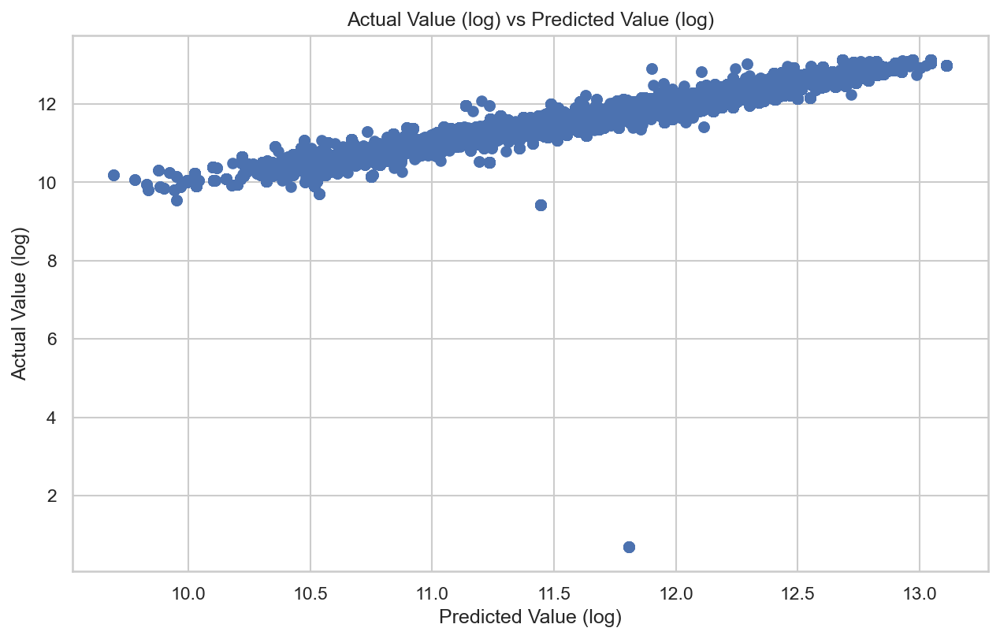

In [51]:
# Regression Fit with Log
plt.figure(figsize=(10,6),dpi=150),
lr = LinearRegression()
fit = lr.fit(X,y);
pred = lr.predict(X)
plt.scatter(pred,y)
plt.title("Actual Value (log) vs Predicted Value (log)")
plt.xlabel("Predicted Value (log)")
plt.ylabel("Actual Value (log)")
plt.show()

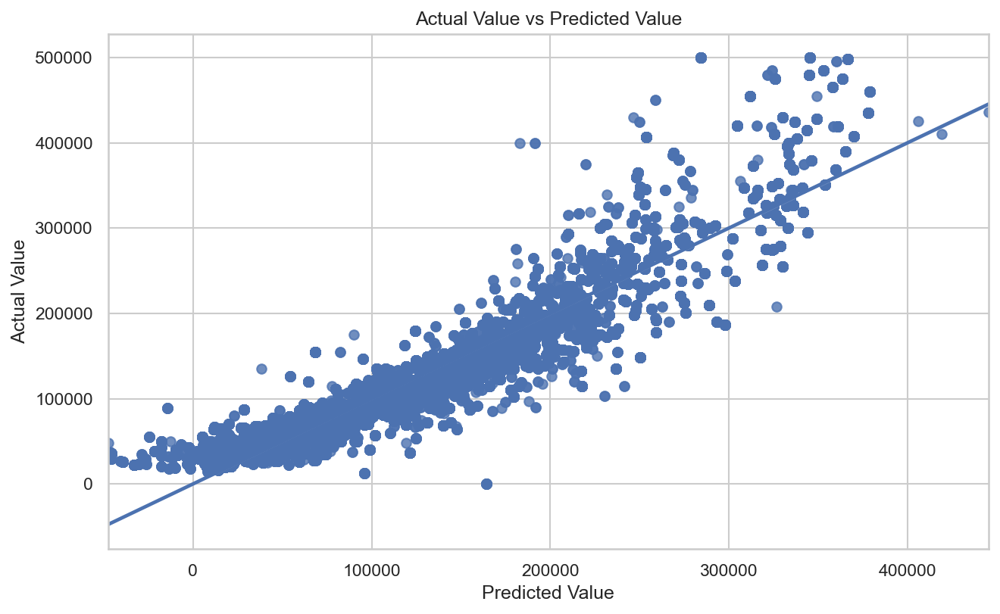

In [52]:
plt.figure(figsize=(10,6),dpi=150),
lr = LinearRegression()
fit = lr.fit(X,np.exp(y));
pred = lr.predict(X)
sns.regplot(x=pred,y=np.exp(y),data=cars)
plt.title("Actual Value vs Predicted Value")
plt.xlabel("Predicted Value")
plt.ylabel("Actual Value")
plt.show()